In [0]:
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.pooling import AveragePooling2D
from keras.applications import ResNet50
from keras.layers.core import Dropout
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers import Input
from keras.models import Model
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.core import Activation
from keras.optimizers import SGD
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os

In [0]:
LABELS = set(["Weights", "Tennis", "Football"])

In [0]:
imagePaths = list(paths.list_images("/content/Images/Football"))

In [0]:
len(imagePaths)

193

In [0]:
imagePaths =  imagePaths + list(paths.list_images("/content/Images/Tennis"))

In [0]:
len(imagePaths)

306

In [0]:
imagePaths =  imagePaths + list(paths.list_images("/content/Images/Weights"))

In [0]:
len(imagePaths)

491

In [0]:
data = []
labels = []

for imagePath in imagePaths:
	# extract the class label from the filename
	label = imagePath.split(os.path.sep)[-2]
 
	# load the image, convert it to RGB channel ordering, and resize
	# it to be a fixed 224x224 pixels, ignoring aspect ratio
	image = cv2.imread(imagePath)
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	image = cv2.resize(image, (224, 224))
 
	# update the data and labels lists, respectively
	data.append(image)
	labels.append(label)

In [0]:
data = np.array(data)
labels = np.array(labels)
 
# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)

In [0]:
(trainX, testX, trainY, testY) = train_test_split(data, labels,
	test_size=0.10, stratify=labels, random_state=42)

####Using ResNet50 (with imagenet weights)

In [0]:
trainAug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
  vertical_flip = True,
	fill_mode="nearest")

In [0]:
valAug = ImageDataGenerator(horizontal_flip=True,
  vertical_flip = True,
	fill_mode="nearest")

In [0]:
mean = np.array([123.68, 116.779, 103.939], dtype="float32")
trainAug.mean = mean
valAug.mean = mean

In [0]:
baseModel = ResNet50(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))

W0720 14:28:51.874550 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0720 14:28:51.915221 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0720 14:28:51.925897 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.

W0720 14:28:51.966602 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0720 14:28:51.967660

94658560/94653016 [==============================] - 1s 0us/step


In [0]:
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(len(lb.classes_), activation="softmax")(headModel)

W0720 14:29:08.408631 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3980: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.

W0720 14:29:08.439127 139820966238080 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
model = Model(inputs=baseModel.input, outputs=headModel)

In [0]:
for layer in baseModel.layers:
	layer.trainable = False

In [0]:
opt = SGD(lr=1e-4, momentum=0.9, decay=1e-4 / 50)
model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])
 

W0720 14:29:21.392530 139820966238080 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



In [0]:
import keras

In [0]:
H = model.fit_generator(
	trainAug.flow(trainX, trainY, batch_size=32),
	steps_per_epoch=len(trainX) // 32,
	validation_data=valAug.flow(testX, testY),
	validation_steps=len(testX) // 32,
    callbacks=[keras.callbacks.ModelCheckpoint(
                  'Model.val-acc={val_acc:.2f}.val-loss={val_loss:.2f}.h5',
                  monitor='val_loss',
                  verbose=0,
                  save_best_only=True)],
	epochs=70)

W0720 14:31:05.428560 139820966238080 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/70
13/13 [==============================] - 9s 681ms/step - loss: 1.5552 - acc: 0.3630 - val_loss: 1.4290 - val_acc: 0.4062
Epoch 2/70
13/13 [==============================] - 3s 224ms/step - loss: 1.3371 - acc: 0.4351 - val_loss: 1.0985 - val_acc: 0.5882
Epoch 3/70
13/13 [==============================] - 3s 228ms/step - loss: 1.2708 - acc: 0.3999 - val_loss: 1.0752 - val_acc: 0.5312
Epoch 4/70
13/13 [==============================] - 4s 298ms/step - loss: 1.2007 - acc: 0.4502 - val_loss: 0.9346 - val_acc: 0.6471
Epoch 5/70
13/13 [==============================] - 4s 305ms/step - loss: 1.1330 - acc: 0.4725 - val_loss: 0.8831 - val_acc: 0.6562
Epoch 6/70
13/13 [==============================] - 4s 303ms/step - loss: 1.0212 - acc: 0.5601 - val_loss: 1.0642 - val_acc: 0.5882
Epoch 7/70
13/13 [==============================] - 4s 323ms/step - loss: 1.0131 - acc: 0.5327 - val_loss: 0.8668 - val_acc: 0.6875
Epoch 8/70
13/13 [==============================] - 4s 299ms/step - loss: 0.

####Using Wide-Residual-Network (without predefined weights)

In [0]:
from keras import layers

In [0]:
class WideRN:
  def main_block(x, filters, n, strides, dropout):
    
	  # Normal part
	  x_res = Conv2D(filters, (3,3), strides=strides, padding="same")(x)
	  x_res = BatchNormalization()(x_res)
	  x_res = Activation('relu')(x_res)
	  x_res = Conv2D(filters, (3,3), padding="same")(x_res)
	  # Alternative branch
	  x = Conv2D(filters, (1,1), strides=strides)(x)
	  # Merge Branches
	  x = layers.add([x_res, x])

	  for i in range(n-1):
		  # Residual conection
		  x_res = BatchNormalization()(x)
		  x_res = Activation('relu')(x_res)
		  x_res = Conv2D(filters, (3,3), padding="same")(x_res)
		  # Apply dropout if given
		  if dropout: x_res = Dropout(dropout)(x)
		  # Second part
		  x_res = BatchNormalization()(x_res)
		  x_res = Activation('relu')(x_res)
		  x_res = Conv2D(filters, (3,3), padding="same")(x_res)
		  # Merge branches
		  x = layers.add([x, x_res])

	  # Inter block part
	  x = BatchNormalization()(x)
	  x = Activation('relu')(x)
	  return x
  
  @staticmethod
  def build(input_dims, n, k, act= "relu", dropout=None):
    n = (n-4)//6
    # This returns a tensor input to the model
    inputs = Input(shape=(input_dims))

	  # Head of the model
    x = Conv2D(16, (3,3), padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    # 3 Blocks (normal-residual)
    x = WideRN.main_block(x, 16*k, n, (1,1), dropout) # 0
    x = WideRN.main_block(x, 32*k, n, (2,2), dropout) # 1
    x = WideRN.main_block(x, 64*k, n, (2,2), dropout) # 2

    # Final part of the model
    x = AveragePooling2D((8,8))(x)
    x = Flatten()(x)
    x = Dense(len(lb.classes_))(x)
    outputs = Activation("softmax")(x)
    model = Model(inputs=inputs, outputs=outputs)
    return model


In [0]:
model = WideRN.build((224,224,3), 22, 4)

In [0]:
model.compile(optimizer= 'adam', loss="categorical_crossentropy", metrics= ["accuracy"])

In [0]:
trainAug = ImageDataGenerator(
	rotation_range=30,
	zoom_range=0.15,
	width_shift_range=0.2,
	height_shift_range=0.2,
	shear_range=0.15,
	horizontal_flip=True,
  vertical_flip = True,
	fill_mode="nearest")

In [0]:
valAug = ImageDataGenerator(horizontal_flip=True,
  vertical_flip = True,
	fill_mode="nearest")

In [0]:
H_wrn = model.fit_generator(
	trainAug.flow(trainX, trainY, batch_size=32),
	steps_per_epoch=len(trainX) // 32,
	validation_data=valAug.flow(testX, testY),
	validation_steps=len(testX) // 32,
    callbacks=[keras.callbacks.ModelCheckpoint(
                  'Model-WRN.val-acc={val_acc:.2f}.val-loss={val_loss:.2f}.h5',
                  monitor='val_loss',
                  verbose=0,
                  save_best_only=True)],
	epochs=50)

Epoch 1/50
13/13 [==============================] - 42s 3s/step - loss: 1.6760 - acc: 0.4952 - val_loss: 10.0738 - val_acc: 0.3750
Epoch 2/50
13/13 [==============================] - 26s 2s/step - loss: 1.0961 - acc: 0.6181 - val_loss: 9.1272 - val_acc: 0.1765
Epoch 3/50
13/13 [==============================] - 20s 2s/step - loss: 1.0294 - acc: 0.5785 - val_loss: 3.1766 - val_acc: 0.6562
Epoch 4/50
13/13 [==============================] - 20s 2s/step - loss: 0.9741 - acc: 0.6393 - val_loss: 4.3220 - val_acc: 0.5294
Epoch 5/50
13/13 [==============================] - 20s 2s/step - loss: 1.0955 - acc: 0.6244 - val_loss: 8.9768 - val_acc: 0.3750
Epoch 6/50
13/13 [==============================] - 20s 2s/step - loss: 0.9674 - acc: 0.5874 - val_loss: 5.9517 - val_acc: 0.5294
Epoch 7/50
13/13 [==============================] - 20s 2s/step - loss: 1.0870 - acc: 0.6332 - val_loss: 6.0671 - val_acc: 0.4688
Epoch 8/50
13/13 [==============================] - 20s 2s/step - loss: 0.9891 - acc: 0.6

In [0]:
model.compile(optimizer= opt, loss="categorical_crossentropy", metrics= ["accuracy"])

In [0]:
H_wrn2 = model.fit_generator(
	trainAug.flow(trainX, trainY, batch_size=32),
	steps_per_epoch=len(trainX) // 32,
	validation_data=valAug.flow(testX, testY),
	validation_steps=len(testX) // 32,
    callbacks=[keras.callbacks.ModelCheckpoint(
                  'Model-WRN.val-acc={val_acc:.2f}.val-loss={val_loss:.2f}.h5',
                  monitor='val_loss',
                  verbose=0,
                  save_best_only=True)],
	epochs=70,
 initial_epoch=50)

Epoch 51/70
13/13 [==============================] - 36s 3s/step - loss: 0.6068 - acc: 0.7885 - val_loss: 0.5102 - val_acc: 0.8125
Epoch 52/70
13/13 [==============================] - 20s 2s/step - loss: 0.6748 - acc: 0.7894 - val_loss: 0.4926 - val_acc: 0.7647
Epoch 53/70
13/13 [==============================] - 20s 2s/step - loss: 0.6406 - acc: 0.8177 - val_loss: 0.4976 - val_acc: 0.7812
Epoch 54/70
13/13 [==============================] - 20s 2s/step - loss: 0.6069 - acc: 0.8142 - val_loss: 0.2645 - val_acc: 0.9412
Epoch 55/70
13/13 [==============================] - 20s 2s/step - loss: 0.5845 - acc: 0.7932 - val_loss: 0.3955 - val_acc: 0.8750
Epoch 56/70
13/13 [==============================] - 20s 2s/step - loss: 0.7614 - acc: 0.7870 - val_loss: 0.3466 - val_acc: 0.9412
Epoch 57/70
13/13 [==============================] - 21s 2s/step - loss: 0.5163 - acc: 0.8223 - val_loss: 0.4477 - val_acc: 0.7812
Epoch 58/70
13/13 [==============================] - 20s 2s/step - loss: 0.6152 - a

##### ResNet50:
  Highest Val Acc = 1.00
  
  Least Val-Loss = 0.12
  
  Total Epochs = 70
  
  Optimizer = SGD
  
  
##### Wide Residual Network:
  Highest Val Acc = 0.94 
  
  Least Val-Loss = 0.26
  
  Total Epochs = 50 + 20
  
  Optimizer = Adam for first 50 epochs and SGD for next 20      epochs

In [0]:
from keras.models import load_model
from collections import deque

In [0]:
model_resNet = load_model("/content/Model.val-acc=1.00.val-loss=0.12.h5")

In [0]:
model_Wrn = load_model("/content/Model-WRN.val-acc=0.94.val-loss=0.26.h5")

In [0]:
from google.colab.patches import cv2_imshow

Prediction using ResNet:

In [0]:
mean = np.array([123.68, 116.779, 103.939][::1], dtype="float32")
Q = deque(maxlen=128)

In [0]:
vs_wgt = cv2.VideoCapture("/content/example_clips/lifting.mp4")
vs_foot = cv2.VideoCapture("/content/example_clips/soccer.mp4")
vs_ten = cv2.VideoCapture("/content/example_clips/tennis.mp4")

In [0]:
def pred_resnset(vs, save_as):
  writer = None
  (W, H) = (None, None)
  Q = deque(maxlen=128)
  s=1
  
  while s<10:
	# read the next frame from the file
	  (grabbed, frame) = vs.read()

	# if the frame was not grabbed, then we have reached the end
	# of the stream
	  if not grabbed:
		  break

	# if the frame dimensions are empty, grab them
	  if W is None or H is None:
		  (H, W) = frame.shape[:2]

	# clone the output frame, then convert it from BGR to RGB
	# ordering, resize the frame to a fixed 224x224, and then
	# perform mean subtraction
	  output = frame.copy()
	  frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
	  frame = cv2.resize(frame, (224, 224)).astype("float32")
	  frame -= mean

	# make predictions on the frame and then update the predictions
	# queue
	  preds = model_resNet.predict(np.expand_dims(frame, axis=0))[0]
	  Q.append(preds)

	# perform prediction averaging over the current history of
	# previous predictions
	  results = np.array(Q).mean(axis=0)
	  i = np.argmax(results)
	  label = lb.classes_[i]

	# draw the activity on the output frame
	  text = "activity: {}".format(label)
	  cv2.putText(output, text, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,
		  1.25, (0, 255, 0), 5)

	# check if the video writer is None
	  if writer is None:
		  # initialize our video writer
		  fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		  writer = cv2.VideoWriter("/content/output/" + save_as + "frame.avi", fourcc, 30,
			  (W, H), True)

	# write the output frame to disk
	  writer.write(output)

	# show the output image
	  cv2_imshow(output)
	  #key = cv2.waitKey(1) 

	  s=s+1

  # release the file pointers
  print("[INFO] cleaning up...")
  writer.release()
  vs.release()
  

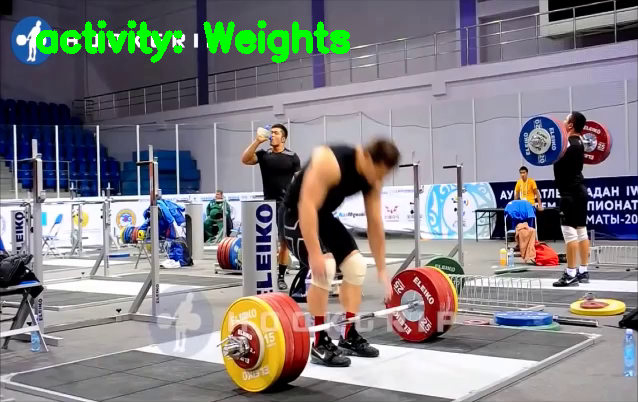

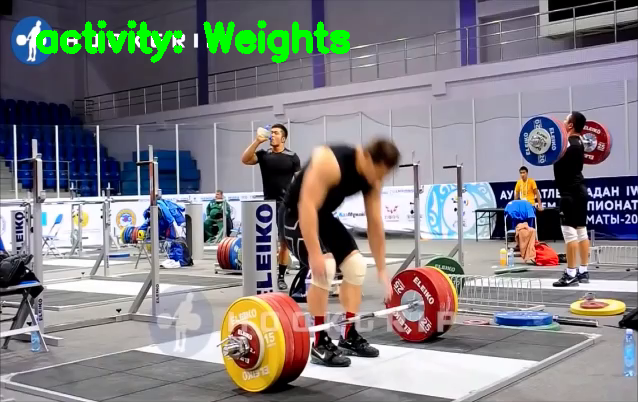

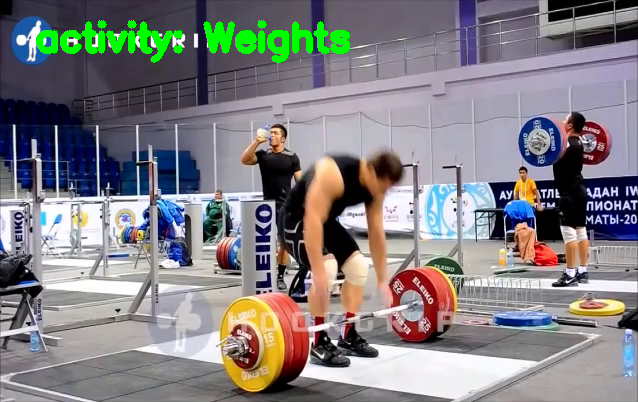

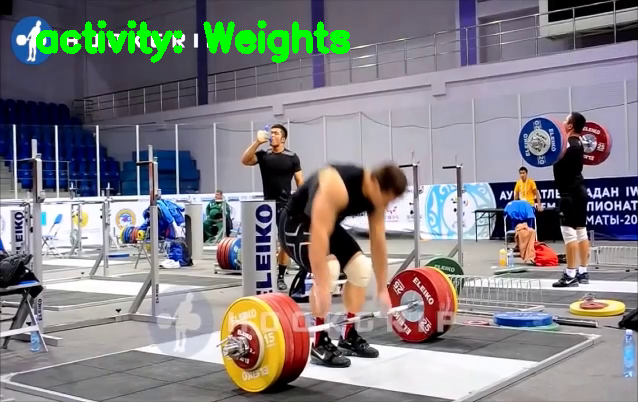

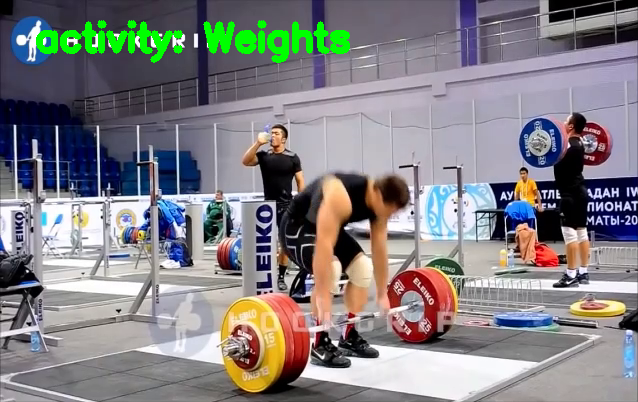

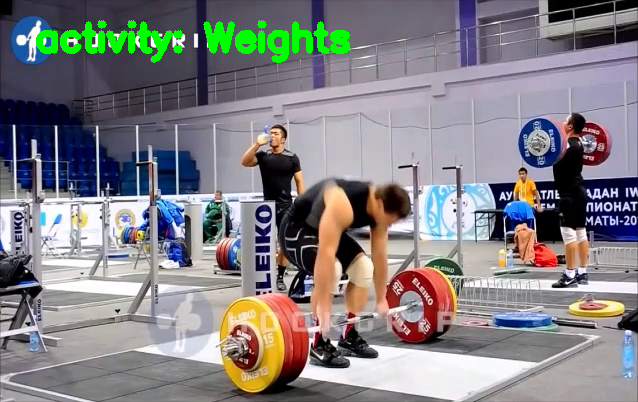

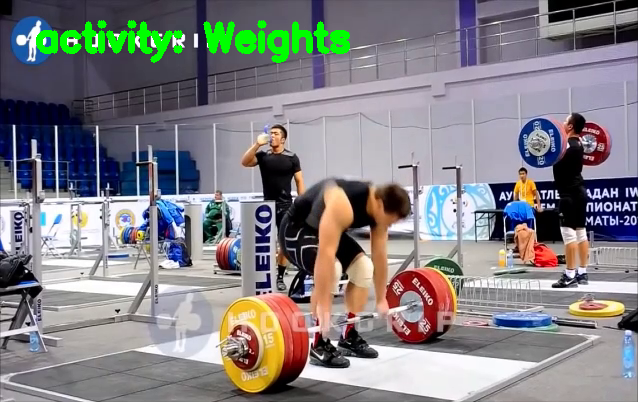

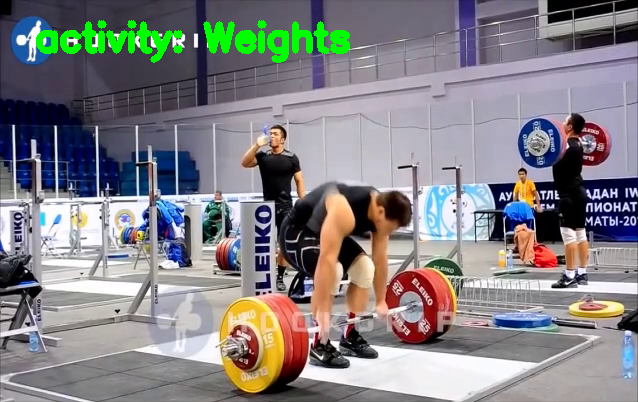

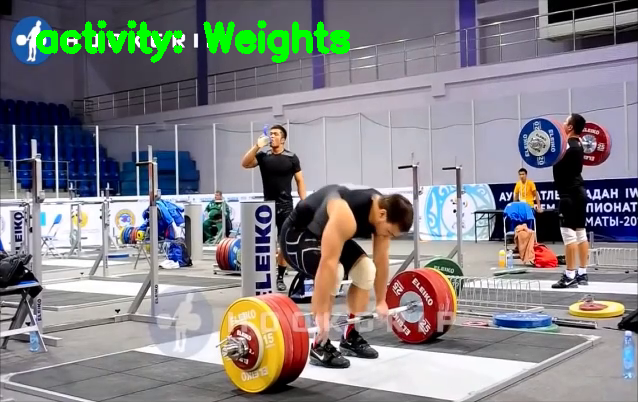

[INFO] cleaning up...


In [0]:
pred_resnset(vs_wgt, "asdfg")

In [0]:
pred_resnset(vs_foot, "qwert")

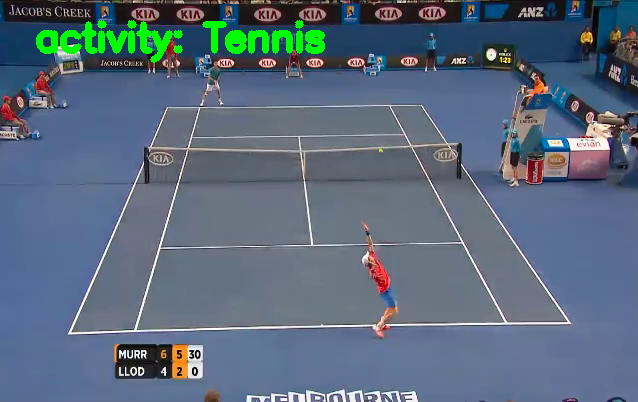

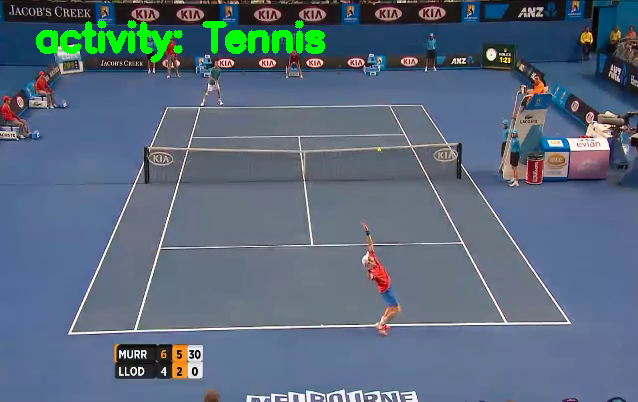

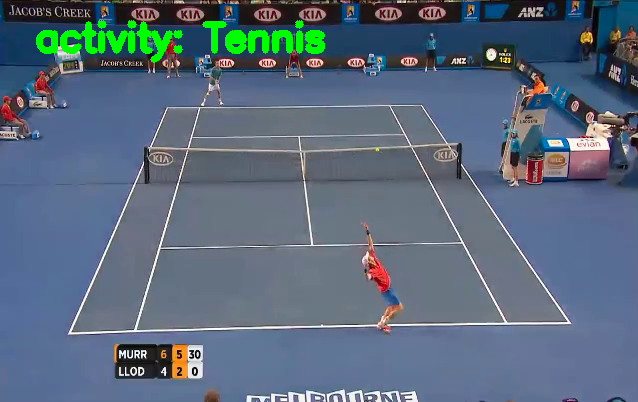

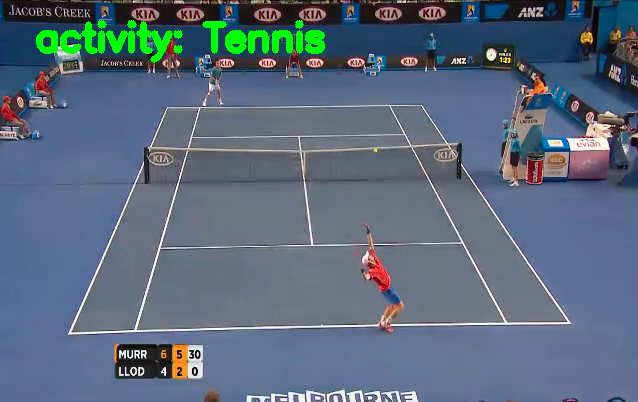

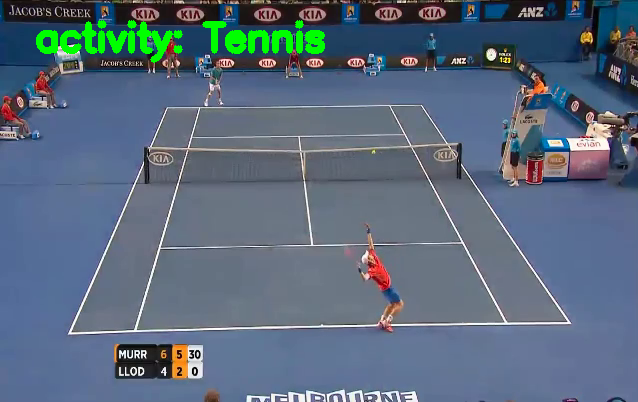

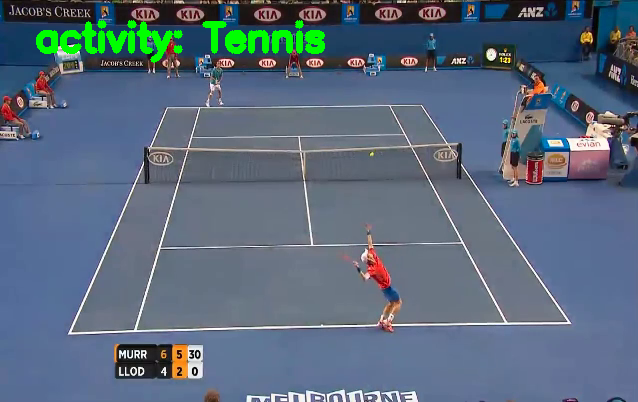

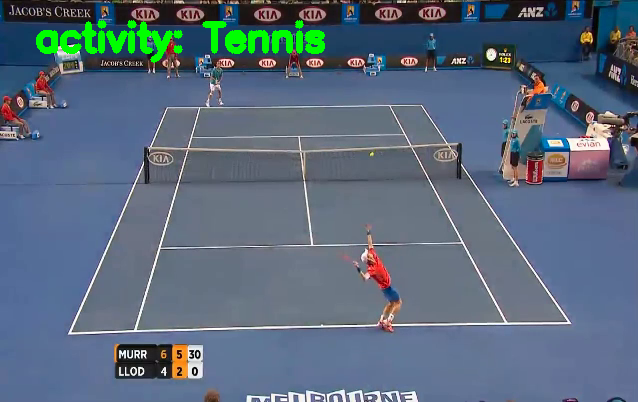

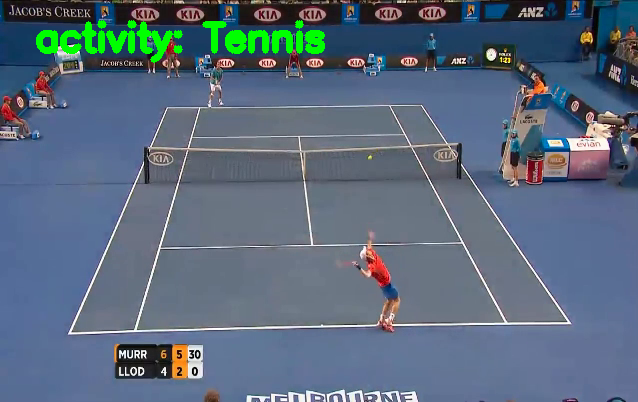

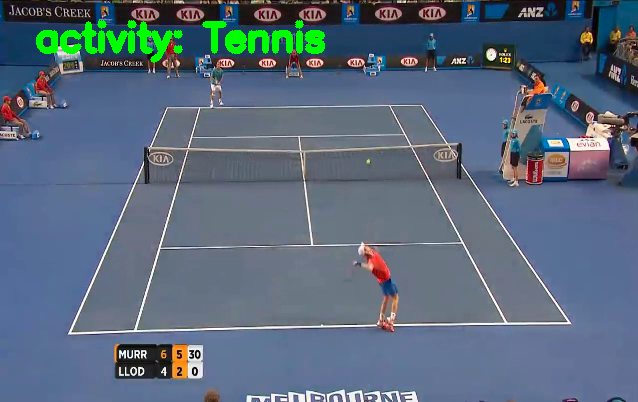

[INFO] cleaning up...


In [0]:
pred_resnset(vs_ten, "fghjk")

Prediction Using Wide Residual Network:

In [0]:
def pred_wrn(vs, save_as):
  writer = None
  (W, H) = (None, None)
  Q = deque(maxlen=128)
  s=1
  
  while s<10:
	# read the next frame from the file
	  (grabbed, frame) = vs.read()

	# if the frame was not grabbed, then we have reached the end
	# of the stream
	  if not grabbed:
		  break

	
	  if W is None or H is None:
		  (H, W) = frame.shape[:2]

	
	
	  output = frame.copy()
	  frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
	  frame = cv2.resize(frame, (224, 224)).astype("float32")
	  

	# make predictions on the frame and then update the predictions
	# queue
	  preds = model_Wrn.predict(np.expand_dims(frame, axis=0))[0]
	  Q.append(preds)

	# perform prediction averaging over the current history of
	# previous predictions
	  results = np.array(Q).mean(axis=0)
	  i = np.argmax(results)
	  label = lb.classes_[i]

	# draw the activity on the output frame
	  text = "activity: {}".format(label)
	  cv2.putText(output, text, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,
		  1.25, (0, 255, 0), 5)

	# check if the video writer is None
	  if writer is None:
		  # initialize our video writer
		  fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		  writer = cv2.VideoWriter("/content/output/" + save_as + "frame.avi", fourcc, 30,
			  (W, H), True)

	# write the output frame to disk
	  writer.write(output)

	# show the output image
	  cv2_imshow(output)
	  #key = cv2.waitKey(1) 

	  s=s+1

  # release the file pointers
  print("[INFO] cleaning up...")
  writer.release()
  vs.release()
  

In [0]:
vs_wgt = cv2.VideoCapture("/content/example_clips/lifting.mp4")
vs_foot = cv2.VideoCapture("/content/example_clips/soccer.mp4")
vs_ten = cv2.VideoCapture("/content/example_clips/tennis.mp4")

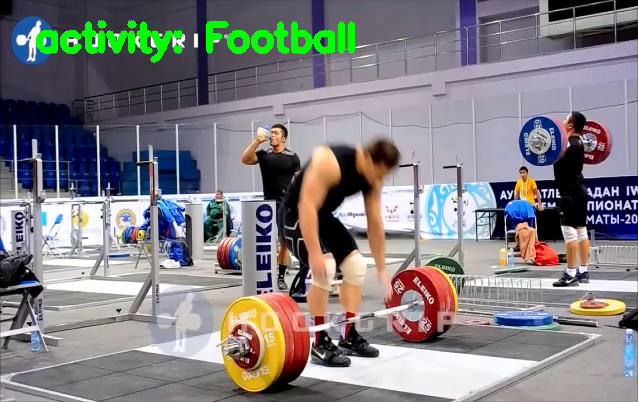

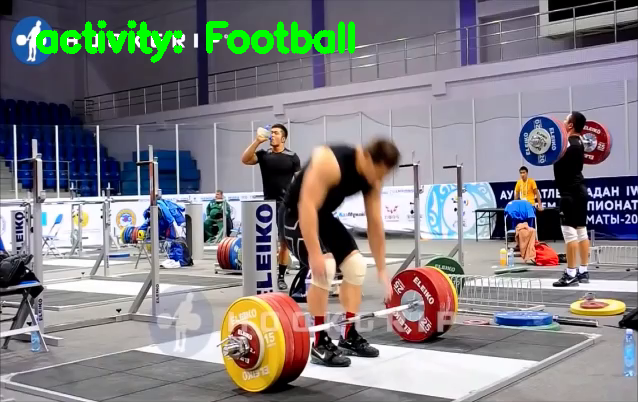

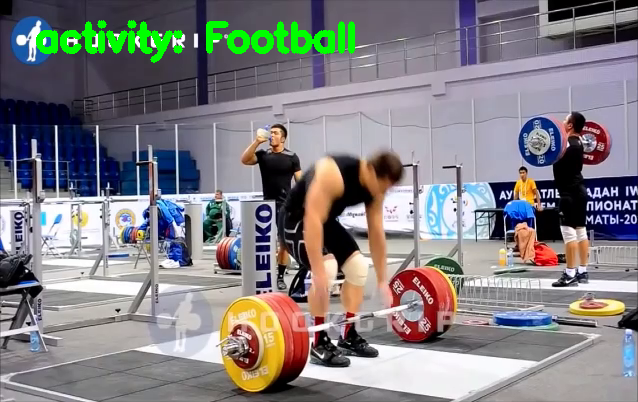

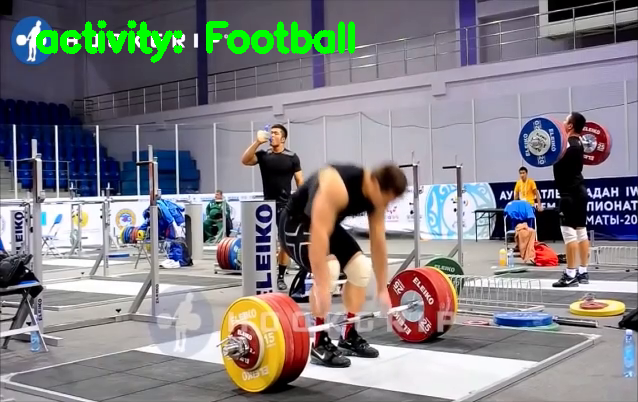

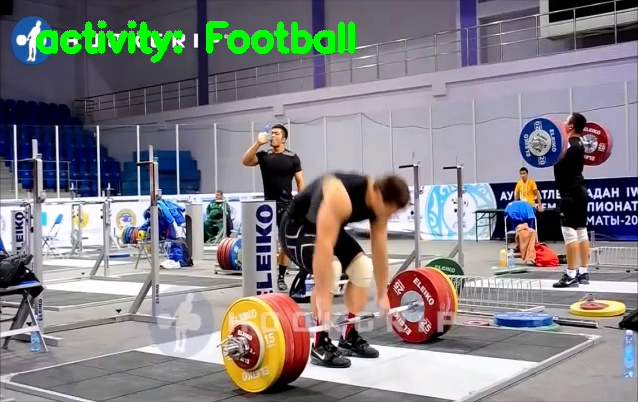

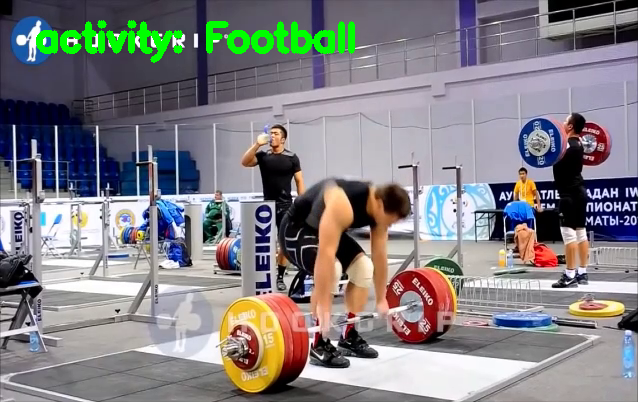

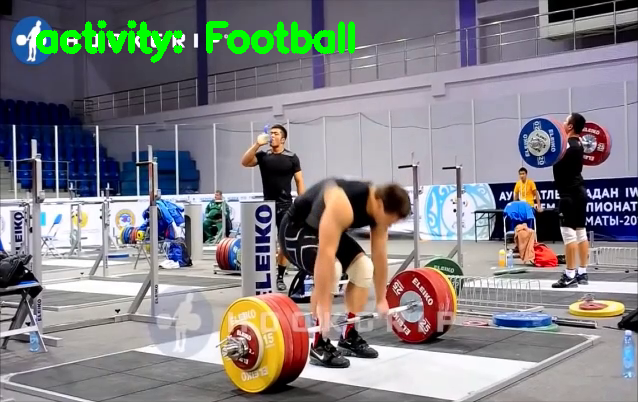

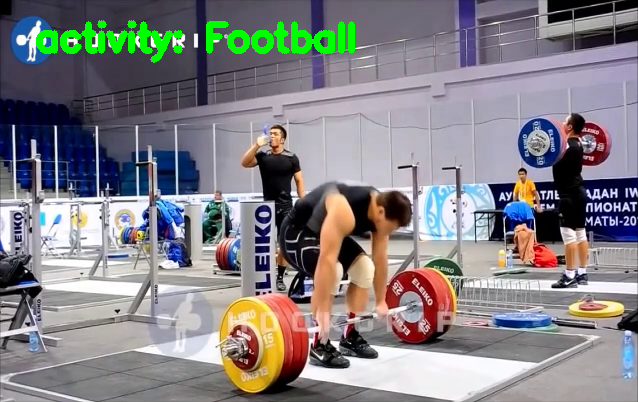

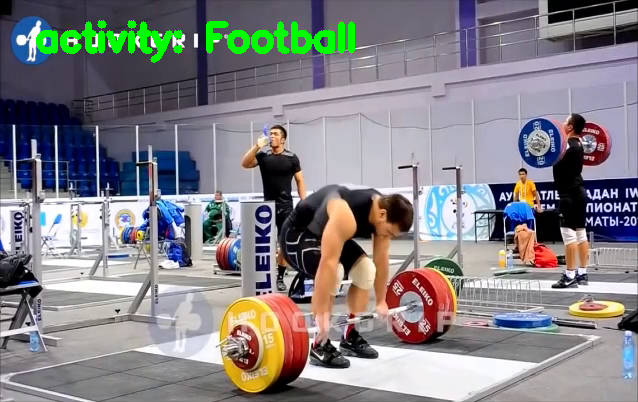

[INFO] cleaning up...


In [0]:
pred(vs_wgt, save_as="lift")

In [0]:
pred(vs_foot, "kk")

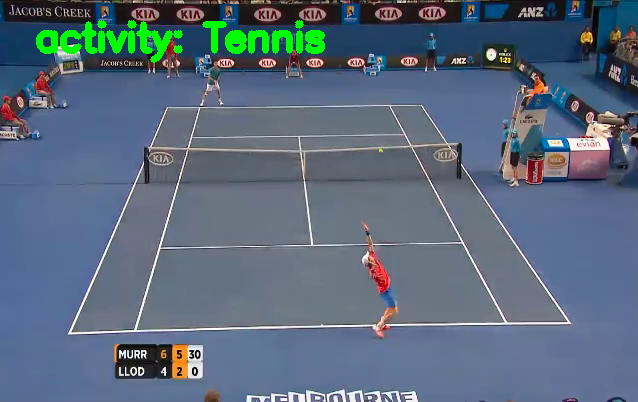

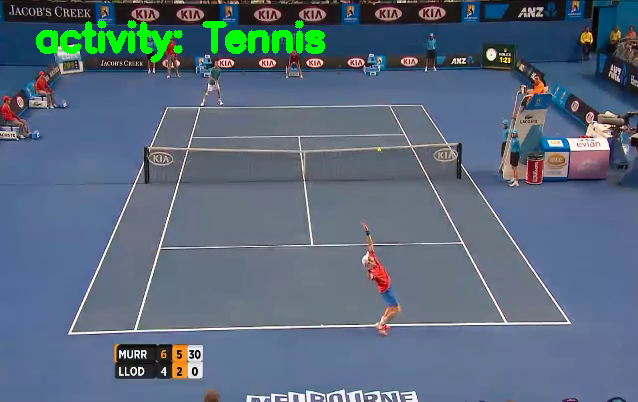

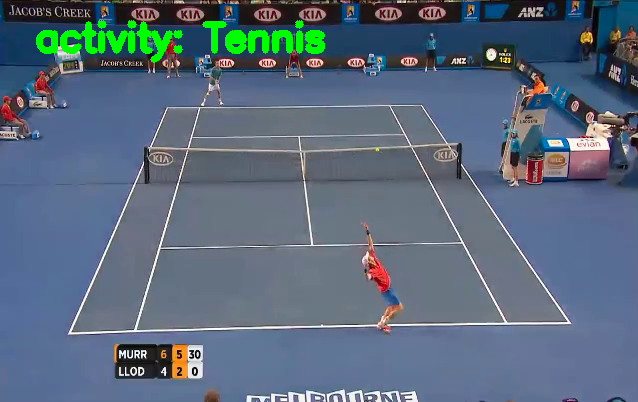

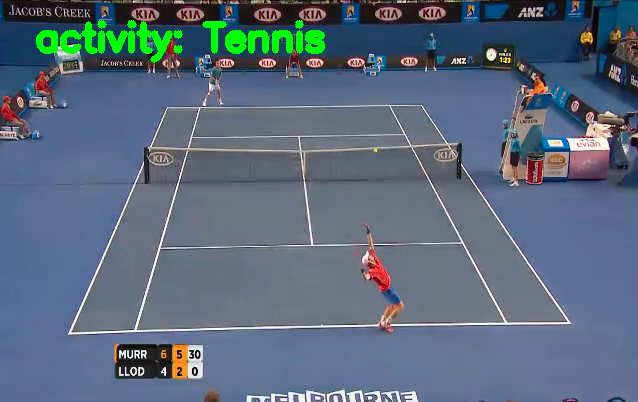

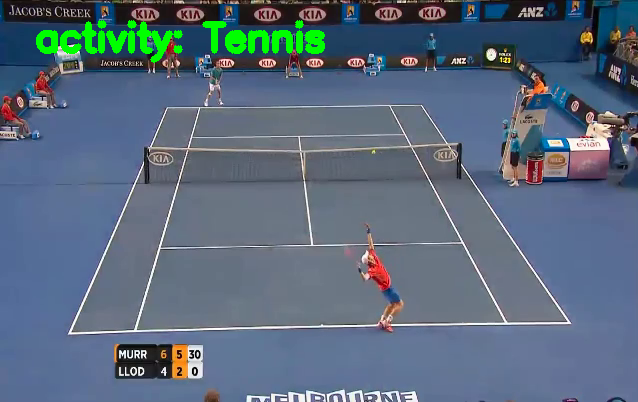

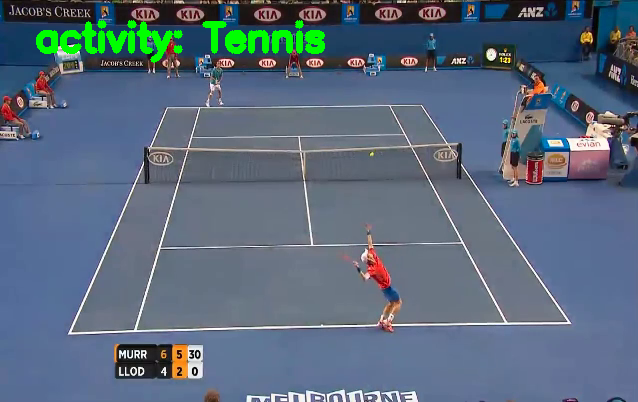

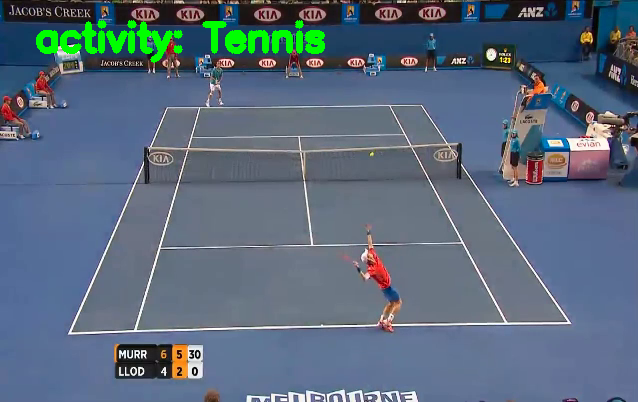

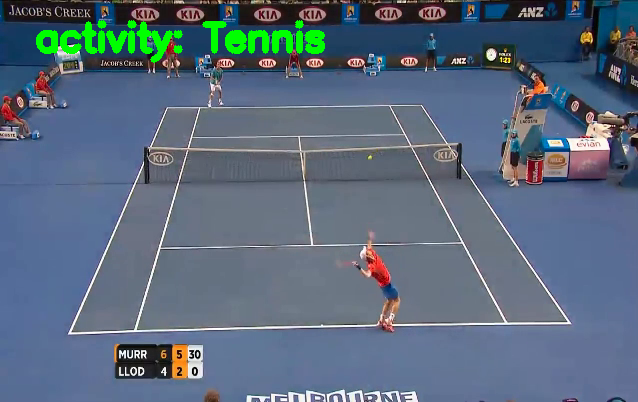

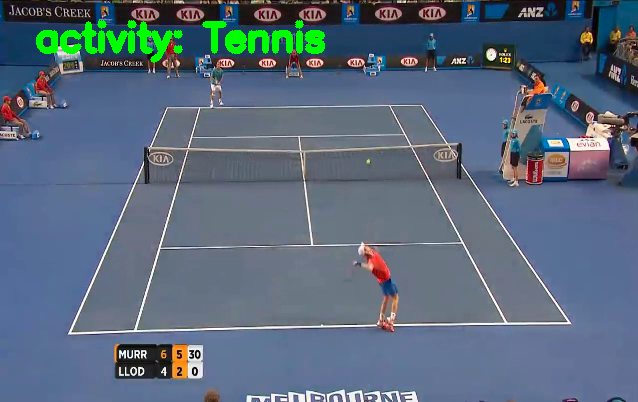

[INFO] cleaning up...


In [0]:
pred(vs_ten, "ak")

Prediction Using both the networks with weightage of 1 to ResNet and 0.94 to WRN.

In [0]:
def pred_both_nets(vs, save_as, x, y):
  writer = None
  (W, H) = (None, None)
  Q = deque(maxlen=128)
  s=1 
  while s<10:
    # read the next frame from the file
    (grabbed, frame) = vs.read()

	  # if the frame was not grabbed, then we have reached the end
    # of the stream
    if not grabbed:
      break

	  # if the frame dimensions are empty, grab them
    if W is None or H is None:
      (H, W) = frame.shape[:2]

    output = frame.copy()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (224, 224)).astype("float32")
    preds_wrn = model_Wrn.predict(np.expand_dims(frame, axis=0))[0]
    frame -= mean
    preds_res = model_resNet.predict(np.expand_dims(frame, axis=0))[0]
    preds = (preds_wrn*x + preds_res*y)/(x+y)
    Q.append(preds)
    results = np.array(Q).mean(axis=0)
    i = np.argmax(results)
    label = lb.classes_[i]
    # draw the activity on the output frame
    text = "activity: {}".format(label)
    cv2.putText(output, text, (35, 50), cv2.FONT_HERSHEY_SIMPLEX,1.25, (0, 255, 0), 5)
    
    # check if the video writer is None
    if writer is None:
      # initialize our video writer
      fourcc = cv2.VideoWriter_fourcc(*"MJPG")
      writer = cv2.VideoWriter("/content/output/" + save_as + "frame.avi", fourcc, 30,
			  (W, H), True)
      
    # write the output frame to disk
    writer.write(output)
    # show the output image
    cv2_imshow(output)
    s=s+1

  # release the file pointers
  print("[INFO] cleaning up...")
  writer.release()
  vs.release()
  

In [0]:
vs_wgt = cv2.VideoCapture("/content/example_clips/lifting.mp4")
vs_foot = cv2.VideoCapture("/content/example_clips/soccer.mp4")
vs_ten = cv2.VideoCapture("/content/example_clips/tennis.mp4")

In [0]:
pred_both_nets(vs_wgt, "lkjh", 0.98, 0.94)

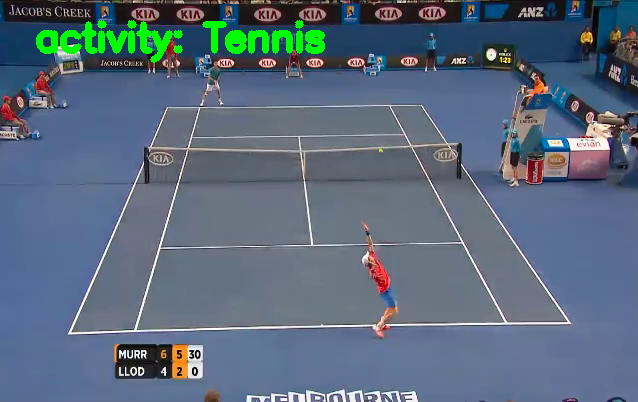

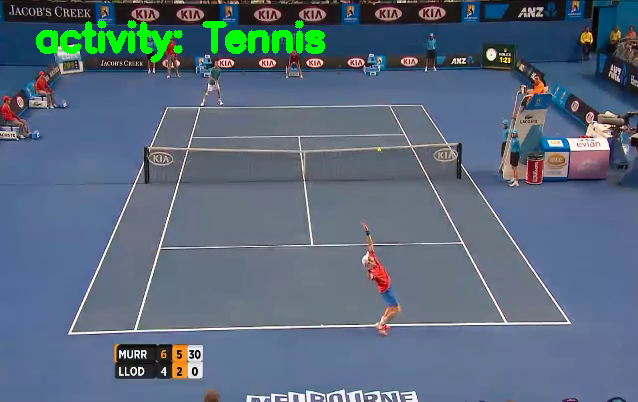

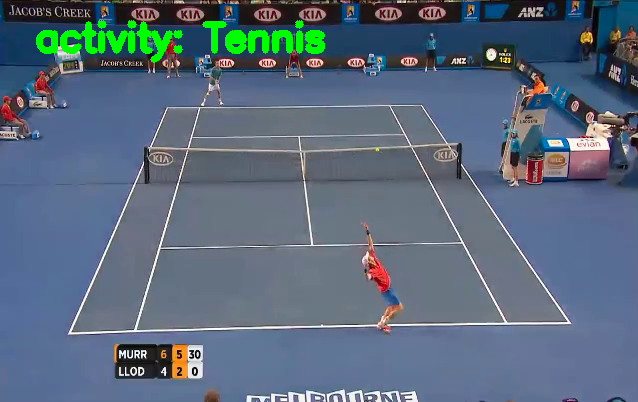

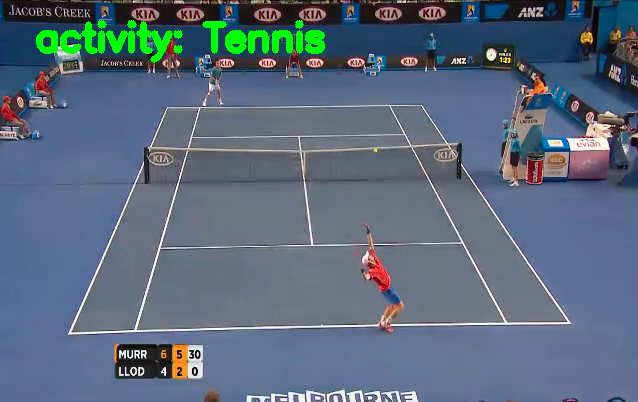

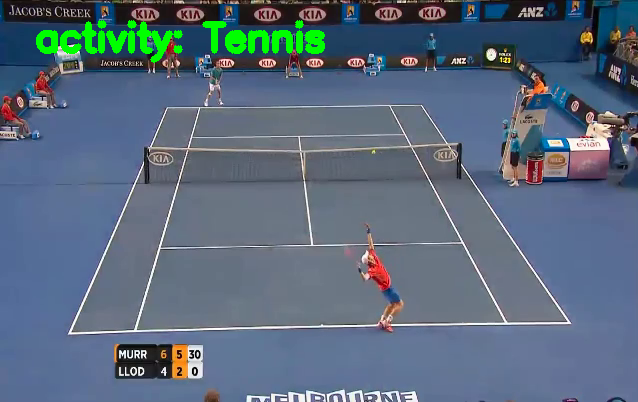

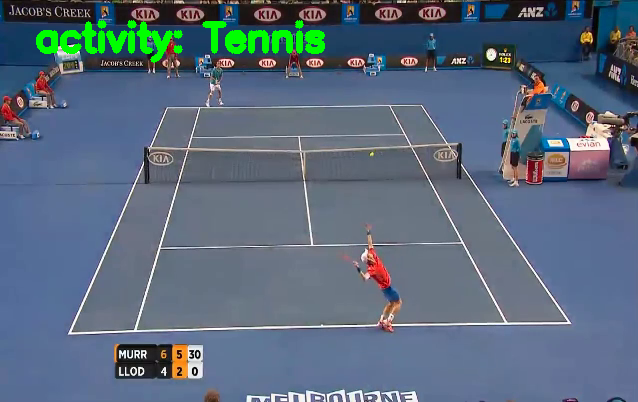

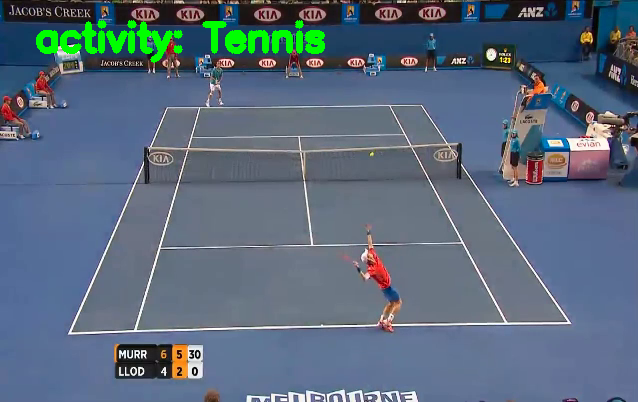

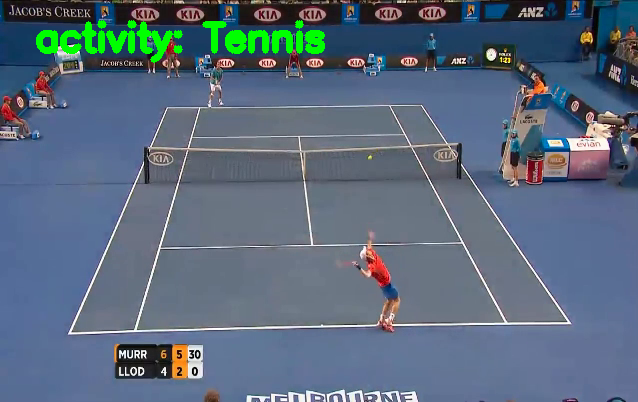

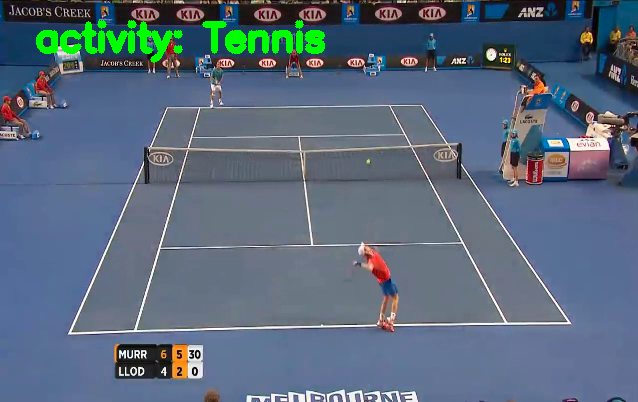

[INFO] cleaning up...


In [0]:
pred_both_nets(vs_ten, "tne", 0.95, 0.95)

In [0]:
pred_both_nets(vs_foot, "toof", 0.9, 0.8)

~ ResNet performed slightly better here for video classifcation as compared to Wide Residual Network.

The combination of both the models also advocated for very accurate classification of the videos per frame.